![](https://s.gr-assets.com/assets/home/header_logo-8d96d7078a3d63f9f31d92282fd67cf4.png)

# <center><span style="color:green">Goodreads Books Rating Prediction Model</span></center>

## <span style="color:blue">1. Import necessary Packages</span>

In [4040]:
import pandas as pd
import numpy as np
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import datetime, date, time
import plotly.express as px

## <span style="color:blue">2. Import data and create the dataframe</span>

In [4041]:
file_path = "books.csv"

In [4042]:
# lines 3350, 4704, 5879 and 8981 were corrected manually because comas has been displayed into some cases instead of slashes
# we did'nt transform the bookIDs to index because the numbers do not seem to follow each other
df = pd.read_csv(file_path , sep = ",")

In [4043]:
# here we are stripping all the column names from white spaces to avoid problem in calling them
#(for example the "num_pages" was at the beginning "  num_pages")
df.columns = df.columns.str.strip()

In [4044]:
df

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,0439785960,9780439785969,eng,652,2095690,27591,9/16/2006,Scholastic Inc.
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,0439358078,9780439358071,eng,870,2153167,29221,9/1/2004,Scholastic Inc.
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,0439554896,9780439554893,eng,352,6333,244,11/1/2003,Scholastic
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,eng,435,2339585,36325,5/1/2004,Scholastic Inc.
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,0439682584,9780439682589,eng,2690,41428,164,9/13/2004,Scholastic
...,...,...,...,...,...,...,...,...,...,...,...,...
11122,45631,Expelled from Eden: A William T. Vollmann Reader,William T. Vollmann/Larry McCaffery/Michael He...,4.06,1560254416,9781560254416,eng,512,156,20,12/21/2004,Da Capo Press
11123,45633,You Bright and Risen Angels,William T. Vollmann,4.08,0140110879,9780140110876,eng,635,783,56,12/1/1988,Penguin Books
11124,45634,The Ice-Shirt (Seven Dreams #1),William T. Vollmann,3.96,0140131965,9780140131963,eng,415,820,95,8/1/1993,Penguin Books
11125,45639,Poor People,William T. Vollmann,3.72,0060878827,9780060878825,eng,434,769,139,2/27/2007,Ecco


## <span style="color:blue">3. Data exploration</span>

In [4045]:
df.describe().round(2)

,bookID,average_rating,isbn13,num_pages,ratings_count,text_reviews_count
count,11127.00,11127.00,1.112700e+04,11127.00,11127.00,11127.00
mean,21310.94,3.93,9.759888e+12,336.38,17936.41,541.85
std,13093.36,0.35,4.428964e+11,241.13,112479.44,2576.18
min,1.00,0.00,8.987060e+09,0.00,0.00,0.00
25%,10287.00,3.77,9.780345e+12,192.00,104.00,9.00
50%,20287.00,3.96,9.780586e+12,299.00,745.00,46.00
75%,32104.50,4.14,9.780873e+12,416.00,4993.50,237.50
max,45641.00,5.00,9.790008e+12,6576.00,4597666.00,94265.00


### What are the data types by column ?

In [4046]:
df.dtypes

bookID                  int64
title                  object
authors                object
average_rating        float64
isbn                   object
isbn13                  int64
language_code          object
num_pages               int64
ratings_count           int64
text_reviews_count      int64
publication_date       object
publisher              object
dtype: object

### Is there NAs in the dataframe ?

**<p>Answer : seems all cells are clean, but we must explore some columns in detail.</p>**

In [4047]:
df.isna().sum()

bookID                0
title                 0
authors               0
average_rating        0
isbn                  0
isbn13                0
language_code         0
num_pages             0
ratings_count         0
text_reviews_count    0
publication_date      0
publisher             0
dtype: int64

In [4048]:
df.describe(exclude=[np.number])

,title,authors,isbn,language_code,publication_date,publisher
count,11127,11127,11127,11127,11127,11127
unique,10352,6643,11127,27,3679,2292
top,The Iliad,Stephen King,0062507540,eng,10/1/2005,Vintage
freq,9,40,1,8911,56,318


### Exploration of the average_rating values

In [4049]:
df.average_rating.describe().round(2)

count    11127.00
mean         3.93
std          0.35
min          0.00
25%          3.77
50%          3.96
75%          4.14
max          5.00
Name: average_rating, dtype: float64

**<p>Here we can see the books that got the maximum grade (5), they seem to have a very low number of ratings.<br />
    So I will exlude them of the dataset has they are probably not relevant.</p>**

In [4050]:
df.loc[df.average_rating == 5]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
624,2034,Comoediae 1: Acharenses/Equites/Nubes/Vespae/P...,Aristophanes/F.W. Hall/W.M. Geldart,5.0,0198145047,9780198145042,grc,364,0,0,2/22/1922,Oxford University Press USA
786,2560,Willem de Kooning: Late Paintings,Julie Sylvester/David Sylvester,5.0,382960226X,9783829602266,eng,83,1,0,9/1/2006,Schirmer Mosel
855,2843,Literature Circle Guide: Bridge to Terabithia:...,Tara MacCarthy,5.0,0439271711,9780439271714,eng,32,4,1,1/1/2002,Teaching Resources
1243,4287,Middlesex Borough (Images of America: New Jersey),Middlesex Borough Heritage Committee,5.0,0738511676,9780738511672,eng,128,2,0,3/17/2003,Arcadia Publishing
4126,14741,Zone of the Enders: The 2nd Runner Official St...,Tim Bogenn,5.0,0744002354,9780744002355,eng,128,2,0,3/6/2003,BradyGames
4790,17224,The Diamond Color Meditation: Color Pathway to...,John Diamond,5.0,1890995525,9781890995522,eng,74,5,3,2/1/2006,Square One Publishers
4935,17830,Bulgakov's the Master and Margarita: The Text ...,Elena N. Mahlow,5.0,0533017424,9780533017423,eng,202,4,0,1/1/1975,Vantage Press
5025,18184,The Complete Theory Fun Factory: Music Theory ...,Ian Martin/Katie Elliott,5.0,0851621813,9780851621814,eng,96,1,0,6/1/2004,Boosey & Hawkes Inc
5476,19786,The Goon Show Volume 4: My Knees Have Fallen ...,NOT A BOOK,5.0,0563388692,9780563388692,eng,2,3,0,4/1/1996,BBC Physical Audio
5478,19788,The Goon Show Volume 11: He's Fallen in the W...,NOT A BOOK,5.0,0563388323,9780563388326,eng,2,2,0,10/2/1995,BBC Physical Audio


In [4051]:
#suppression of the "5" average_rating to avoid non-relevant values
df = df.loc[df.average_rating < 5]
df.average_rating.describe().round(2)

count    11105.00
mean         3.93
std          0.35
min          0.00
25%          3.77
50%          3.96
75%          4.13
max          4.91
Name: average_rating, dtype: float64

<AxesSubplot:xlabel='average_rating', ylabel='ratings_count'>

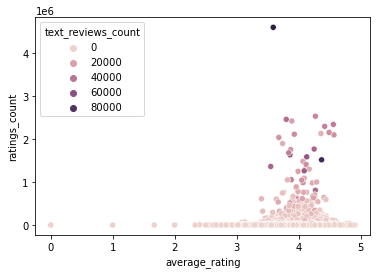

In [4052]:
sns.scatterplot(data=df,x="average_rating",y="ratings_count",hue= "text_reviews_count")

**<p>There seems to be also some books with a "zero" note, in fact we can see here that's because thay have no ratings, again it seems better to exclude them from the dataset has it could interfere with the machine learning part</p>**

In [4053]:
df.loc[df.average_rating == 0]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
265,799,Out to Eat London 2002 (Lonely Planet Out to Eat),Lonely Planet/Mark Honan,0.0,1740592050,9781740592055,eng,295,0,0,9/1/2001,Lonely Planet
375,1302,Juiced Official Strategy Guide,Doug Walsh,0.0,0744005612,9780744005615,eng,112,0,0,6/1/2005,BradyGames
987,3351,Open City 6: The Only Woman He Ever Left,Open City Magazine/James Purdy/Daniel Pinchbec...,0.0,189044717X,9781890447175,eng,200,0,0,10/13/2000,Grove Press Open City Books
2532,9337,How To Meditate: An Anthology Of Talks On Medi...,Frederick P. Lenz,0.0,1932206108,9781932206104,eng,228,0,0,1/1/2004,Frederick P. Lenz Foundation for American Budd...
2533,9338,Insights: Talks On The Nature Of Existence,Frederick P. Lenz,0.0,1932206086,9781932206081,eng,304,0,0,1/1/2003,Frederick P. Lenz Foundation for American Budd...
2758,10200,Venac sonetnih venaca; Puževa srma,Dobrica Erić,0.0,8644101277,9788644101277,srp,222,0,0,1/1/1996,"Izdavačka agencija ""Draganić"""
3493,12712,Brodie's notes on Aldous Huxley's brave new world,Graham Handley,0.0,0333581296,9780333581292,eng,71,0,0,8/20/1992,Macmillan
4242,15186,American Film Guide,Frank N. Magill,0.0,0893562505,9780893562502,eng,5,0,0,1/1/1983,Salem Press Inc
4678,16806,The Man and the Author: John Milton: Twentieth...,J. Martin Evans,0.0,0415940478,9780415940474,eng,386,0,0,11/8/2002,Routledge
5325,19257,Canopy: A Work for Voice and Light in Harvard ...,David Ward/Parveen Adams/Seamus Heaney/Ivan ...,0.0,0916724948,9780916724948,eng,63,0,0,12/31/1997,Arts Publications


In [4054]:
#suppression of the "0" average_rating
df = df.loc[df.average_rating > 0]
df.average_rating.describe().round(2)

count    11079.00
mean         3.94
std          0.29
min          1.00
25%          3.77
50%          3.96
75%          4.13
max          4.91
Name: average_rating, dtype: float64

### Exploration of the ratings_count values

In [4055]:
df.ratings_count.describe().round(2)

count      11079.00
mean       18014.12
std       112716.65
min            0.00
25%          108.00
50%          755.00
75%         5031.00
max      4597666.00
Name: ratings_count, dtype: float64

**<p>We can see there is still books with "0" ratings count, and they have a non-zero average rating, which seems very odd, again it's better to exclude them</p>**

In [4056]:
df.loc[df.ratings_count == 0]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
264,797,Lonely Planet Londres,Lonely Planet/Sarah Johnstone/Tom Masters,4.03,8408064762,9788408064763,spa,480,0,0,5/1/2006,Geoplaneta
525,1658,American Government: Continuity and Change Al...,Karen O'Connor/Larry J. Sabato,2.83,0321317106,9780321317100,eng,664,0,0,3/11/2005,Longman Publishing Group
526,1664,Essentials of American and Texas Government: C...,Karen O'Connor/Larry J. Sabato,3.50,0321365208,9780321365200,eng,854,0,0,7/29/2005,Longman Publishing Group
747,2411,Melville and the politics of identity: From *K...,Julian Markels,3.33,0252063023,9780252063022,eng,164,0,0,7/1/1993,University of Illinois Press
935,3084,April May und June,Elizabeth von Arnim,3.88,345833422X,9783458334224,ger,88,0,0,4/1/1995,Insel Frankfurt
1110,3754,Dr No / Moonraker / Thunderball / From Russia ...,Ian Fleming,3.98,0862731585,9780862731588,eng,862,0,0,1/1/1984,Heinemann-Octopus
1681,5863,V.S. Naipaul,Bruce Alvin King,2.00,1403904561,9781403904560,eng,240,0,0,10/10/2003,Palgrave Macmillan
2051,7400,The Baby Emergency (Tennengarrah Clinic #1),Carol Marinelli,3.60,0263181499,9780263181494,eng,285,0,0,6/1/2004,Mills & Boon
2255,8077,Animales No Se Visten Los (Animals Should Def...,Judi Barrett/Ron Barrett,4.11,1595191356,9781595191359,eng,32,0,0,10/30/1991,Live Oak Media
2956,10939,Ya Sé Que Te Quiero,Billy Crystal/Elizabeth Sayles,4.19,0060845988,9780060845988,spa,40,0,0,4/11/2006,Rayo


In [4057]:
#suppression of the "0" ratings_count
df = df.loc[df.ratings_count > 0]

In [4058]:
df.ratings_count.describe().round(2)

count      11027.00
mean       18099.06
std       112975.33
min            1.00
25%          111.00
50%          768.00
75%         5073.50
max      4597666.00
Name: ratings_count, dtype: float64

**<p>Here we can see that the ratings_counts have some very large values, but are they real outliers ?</p>**

<AxesSubplot:xlabel='ratings_count'>

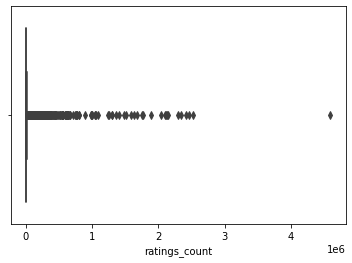

In [4059]:
sns.boxplot(data=df, x="ratings_count")

<AxesSubplot:xlabel='ratings_count'>

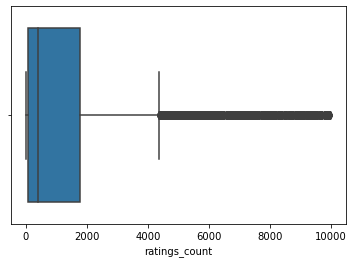

In [4060]:
##same but under 10000
sns.boxplot(data=df.loc[df.ratings_count < 10000], x="ratings_count")

**<p>Looking at the data we can see it's not illogical, all those books are very famous, so they have a great number of ratings and text reviews, so we can keep them for now, we'll see later in the machine learning part if they are relevant</p>**

In [4061]:
df.nlargest(n=10, columns=['ratings_count'])

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
10340,41865,Twilight (Twilight #1),Stephenie Meyer,3.59,0316015849,9780316015844,eng,501,4597666,94265,9/6/2006,Little Brown and Company
1697,5907,The Hobbit or There and Back Again,J.R.R. Tolkien,4.27,0618260307,9780618260300,eng,366,2530894,32871,8/15/2002,Houghton Mifflin
1462,5107,The Catcher in the Rye,J.D. Salinger,3.80,0316769177,9780316769174,eng,277,2457092,43499,1/30/2001,Back Bay Books
307,960,Angels & Demons (Robert Langdon #1),Dan Brown,3.89,1416524797,9781416524793,eng,736,2418736,21303,4/1/2006,Pocket Books
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,eng,435,2339585,36325,5/1/2004,Scholastic Inc.
4416,15881,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling/Mary GrandPré,4.42,0439064864,9780439064866,eng,341,2293963,34692,6/2/1999,Arthur A. Levine Books / Scholastic Inc.
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,0439358078,9780439358071,eng,870,2153167,29221,9/1/2004,Scholastic Inc.
23,34,The Fellowship of the Ring (The Lord of the Ri...,J.R.R. Tolkien,4.36,0618346252,9780618346257,eng,398,2128944,13670,9/5/2003,Houghton Mifflin Harcourt
2114,7613,Animal Farm,George Orwell/Boris Grabnar/Peter Škerl,3.93,0452284244,9780452284241,eng,122,2111750,29677,5/6/2003,NAL
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,0439785960,9780439785969,eng,652,2095690,27591,9/16/2006,Scholastic Inc.


### Exploration of the text_reviews_count

In [4062]:
df.text_reviews_count.describe().round(2)

count    11027.00
mean       546.77
std       2587.31
min          0.00
25%          9.00
50%         48.00
75%        242.00
max      94265.00
Name: text_reviews_count, dtype: float64

**<p>We have some books with a "0" text_reviews_count, but they have some ratings so it's not a problem</p>**

In [4063]:
df.loc[df.text_reviews_count == 0]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
31,54,Molly Hatchet - 5 of the Best,Molly Hatchet,4.33,1575606240,9781575606248,eng,56,6,0,6/10/2003,Cherry Lane Music Company
77,131,The Power of One: The Solo Play for Playwright...,Louis E. Catron,3.67,0325001537,9780325001531,eng,240,10,0,2/7/2000,Heinemann Drama
80,135,What to Sell on ebay and Where to Get It: The ...,Chris Malta/Lisa Suttora,3.62,0072262788,9780072262780,eng,260,24,0,1/24/2006,McGraw-Hill
82,138,eBay: Top 100 Simplified Tips & Tricks,Julia Wilkinson,4.27,0471933821,9780471933823,eng,260,9,0,6/6/2006,Wiley
102,166,Dalit: The Black Untaouchables of India,V.T. Rajshekar/Y.N. Kly,4.20,0932863051,9780932863058,eng,100,10,0,1/28/1995,Clarity Press
...,...,...,...,...,...,...,...,...,...,...,...,...
11040,45294,Love Hate and Everything in Between: Expressi...,Mamiko Murakami/Ernest Reiss,3.54,4770028032,9784770028037,eng,176,27,0,3/1/2002,Kodansha
11064,45392,The Brave Women of the Gulf Wars: Operation De...,Karen Zeinert/Mary Miller,4.00,0761327053,9780761327059,eng,112,1,0,9/1/2005,Twenty-First Century Books (CT)
11076,45450,La última oportunidad,Eoin Colfer,3.77,0307350053,9780307350053,spa,258,2,0,4/4/2006,Plaza y Janes
11095,45516,The Die Broke Financial Problem Solver,Stephen M. Pollan/Mark LeVine,2.33,0066619912,9780066619910,en-US,272,3,0,12/26/2000,William Morrow Paperbacks


**<p>As with the ratings, the text reviews have some very large values</p>**

<AxesSubplot:xlabel='text_reviews_count'>

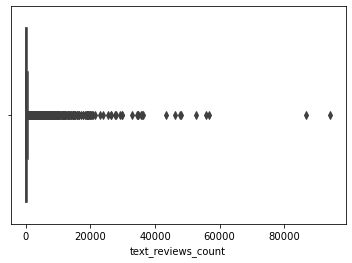

In [4064]:
sns.boxplot(data=df, x="text_reviews_count")

<AxesSubplot:xlabel='text_reviews_count'>

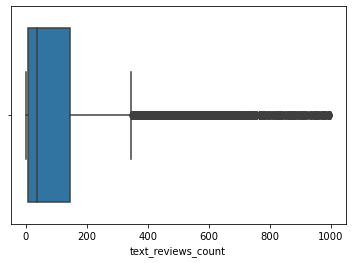

In [4065]:
#same but under 1000
sns.boxplot(data=df.loc[df.text_reviews_count < 1000], x="text_reviews_count")

**<p>They are the same books as before, all very famous. We will keep those rows for now, but we can say the ratings and text reviews seem to be corelated with the popularity of the books</p>**

In [4066]:
df.nlargest(n=10, columns=['text_reviews_count'])

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
10340,41865,Twilight (Twilight #1),Stephenie Meyer,3.59,0316015849,9780316015844,eng,501,4597666,94265,9/6/2006,Little Brown and Company
5272,19063,The Book Thief,Markus Zusak/Cao Xuân Việt Khương,4.37,0375831002,9780375831003,eng,552,1516367,86881,3/14/2006,Alfred A. Knopf
1069,3636,The Giver (The Giver #1),Lois Lowry,4.13,0385732554,9780385732550,eng,208,1585589,56604,1/24/2006,Ember
284,865,The Alchemist,Paulo Coelho/Alan R. Clarke/Özdemir İnce,3.86,0061122416,9780061122415,eng,197,1631221,55843,5/1/1993,HarperCollins
10704,43641,Water for Elephants,Sara Gruen,4.09,1565125606,9781565125605,eng,335,1260027,52759,5/1/2007,Algonquin Books
7312,28187,The Lightning Thief (Percy Jackson and the Oly...,Rick Riordan,4.25,0786838655,9780786838653,eng,375,1766725,47951,3/1/2006,Disney Hyperion Books
5409,19501,Eat Pray Love,Elizabeth Gilbert,3.55,0143038419,9780143038412,eng,368,1362264,47620,2/1/2007,Riverhead Books
2060,7445,The Glass Castle,Jeannette Walls,4.27,074324754X,9780743247542,eng,288,808656,46176,1/17/2006,Scribner
1462,5107,The Catcher in the Rye,J.D. Salinger,3.80,0316769177,9780316769174,eng,277,2457092,43499,1/30/2001,Back Bay Books
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,eng,435,2339585,36325,5/1/2004,Scholastic Inc.


<AxesSubplot:xlabel='average_rating', ylabel='ratings_count'>

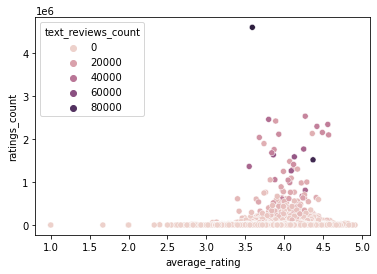

In [4067]:
sns.scatterplot(data=df,x="average_rating",y="ratings_count",hue= "text_reviews_count")

### Exploration of the num_pages

In [4068]:
df.num_pages.describe().round(2)

count    11027.00
mean       337.05
std        241.01
min          0.00
25%        194.00
50%        300.00
75%        416.00
max       6576.00
Name: num_pages, dtype: float64

**<p>Drawing a histogram for num_pages we can see the distribution is left-skewed, are the books with more than 1000 pages relevant ?</p>**

<AxesSubplot:xlabel='num_pages', ylabel='Count'>

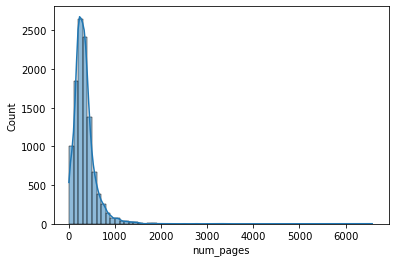

In [4069]:
#d
sns.histplot(data=df,x="num_pages", binwidth=100, kde=True)

**<p>Here are the books with more than 1000 pages, in facts there are for most book sets, so the number of pages seems relevant, we will keep them for now</p>**

In [4070]:
df.loc[df.num_pages > 1000]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,0439682584,9780439682589,eng,2690,41428,164,9/13/2004,Scholastic
6,10,Harry Potter Collection (Harry Potter #1-6),J.K. Rowling,4.73,0439827604,9780439827607,eng,3342,28242,808,9/12/2005,Scholastic
21,30,J.R.R. Tolkien 4-Book Boxed Set: The Hobbit an...,J.R.R. Tolkien,4.59,0345538374,9780345538376,eng,1728,101233,1550,9/25/2012,Ballantine Books
22,31,The Lord of the Rings (The Lord of the Rings ...,J.R.R. Tolkien,4.50,0618517650,9780618517657,eng,1184,1710,91,10/21/2004,Houghton Mifflin Harcourt
24,35,The Lord of the Rings (The Lord of the Rings ...,J.R.R. Tolkien/Alan Lee,4.50,0618260587,9780618260584,en-US,1216,1618,140,10/1/2002,Houghton Mifflin Harcourt
...,...,...,...,...,...,...,...,...,...,...,...,...
10539,42932,Whirlwind (Asian Saga #6),James Clavell,3.82,0340766182,9780340766187,eng,1231,5626,164,12/2/1999,Morrow
10547,42986,War and Remembrance (The Henry Family #2),Herman Wouk,4.41,0316954993,9780316954990,eng,1042,29555,680,2/5/2002,Back Bay Books
10753,43888,The Sword of Truth Boxed Set I: Wizard's Firs...,Terry Goodkind,4.29,0812575601,9780812575606,en-US,2480,4196,81,11/15/1998,Tor Books
10910,44613,Remembrance of Things Past (Boxed Set),Marcel Proust/C.K. Scott Moncrieff/Frederick A...,4.34,0701125594,9780701125592,eng,3400,6,1,3/5/1981,Chatto & Windus


**<p>Here we can see that 75 rows have a number of pages of 0, probably the information were'nt given at first. <br />
    We can also see that 194 rows have a number of pages under 20, which is odd given the books' names:</p>**

In [4071]:
df.loc[df.num_pages == 0, :].describe()

,bookID,average_rating,isbn13,num_pages,ratings_count,text_reviews_count
count,75.000000,75.000000,7.500000e+01,75.0,75.000000,75.000000
mean,21313.893333,3.928400,9.781003e+12,0.0,383.840000,14.906667
std,11362.362676,0.383776,9.712770e+08,0.0,1798.484836,52.045503
min,955.000000,2.620000,9.780061e+12,0.0,1.000000,0.000000
25%,12894.500000,3.795000,9.780554e+12,0.0,7.500000,1.000000
50%,21552.000000,3.950000,9.780739e+12,0.0,24.000000,2.000000
75%,28919.000000,4.160000,9.781400e+12,0.0,83.500000,9.000000
max,45472.000000,4.800000,9.788408e+12,0.0,14388.000000,411.000000


In [4072]:
df.loc[df["num_pages"] <20,:]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
10,16,The Hitchhiker's Guide to the Galaxy (Hitchhik...,Douglas Adams/Stephen Fry,4.22,0739322206,9780739322208,eng,6,1266,253,3/23/2005,Random House Audio
40,68,The Known World,Edward P. Jones/Kevin R. Free,3.83,006076273X,9780060762735,en-US,14,55,12,6/15/2004,HarperAudio
215,524,Lord of the Flies,William Golding,3.68,0307281701,9780307281708,eng,6,408,96,10/11/2005,Listening Library (Audio)
306,955,The 5 Love Languages / The 5 Love Languages Jo...,Gary Chapman,4.70,0802415318,9780802415318,eng,0,22,4,1/1/2005,Moody Publishers
309,966,Angeles & Demonios,Dan Brown/Raúl Amundaray,3.89,0972859896,9780972859899,spa,18,65,7,12/1/2005,FonoLibro
...,...,...,...,...,...,...,...,...,...,...,...,...
10973,44979,Howards End,E.M. Forster/Nadia May,3.96,0786168471,9780786168477,eng,9,32,16,6/1/2007,Blackstone Audiobooks
11008,45161,The Roald Dahl Audio Collection,Roald Dahl,4.41,0061214965,9780061214967,en-US,4,199,36,2/20/2007,HarperCollins Publishers
11080,45465,Artemis Fowl (Artemis Fowl #1),Eoin Colfer/Nathaniel Parker,3.84,1400085918,9781400085910,eng,6,55,14,4/6/2004,Listening Library
11081,45472,Treasury of American Tall Tales: Volume 1: Dav...,David Bromberg/Jay Ungar/Molly Mason/Garrison ...,3.86,0739336509,9780739336502,eng,0,36,9,8/22/2006,Listening Library (Audio)


**<p>As we can see the num_pages mean is around 336, we will change the <20 values by this mean :</p>**

In [4073]:
df.num_pages.describe().round(2)

count    11027.00
mean       337.05
std        241.01
min          0.00
25%        194.00
50%        300.00
75%        416.00
max       6576.00
Name: num_pages, dtype: float64

In [4074]:
#here we change the < 20 values by the num_pages mean
df.loc[df["num_pages"] < 20, "num_pages"] = df.num_pages.mean().round()

In [4075]:
df.num_pages.describe().round(2)

count    11027.00
mean       345.07
std        235.30
min         20.00
25%        208.00
50%        307.00
75%        416.00
max       6576.00
Name: num_pages, dtype: float64

### Exploration of the language_code

**<p>Here we can see that many language codes are below 100 rows, it seems not relevant to keep the languages below 50 rows :</p>**

In [4076]:
lang_count = df.language_code.value_counts().to_frame()
df.language_code.value_counts().to_frame()

,language_code
eng,8829
en-US,1409
en-GB,214
spa,212
fre,140
ger,96
jpn,45
mul,19
zho,14
por,10


In [4077]:
#then we drop the rows with languages below 50 rows :
df = df[df['language_code'].map(df['language_code'].value_counts()) > 20]

In [4078]:
df.language_code.value_counts().to_frame()

,language_code
eng,8829
en-US,1409
en-GB,214
spa,212
fre,140
ger,96
jpn,45


**<p>Visual repartition of the remaining languages :</p>**

array([<AxesSubplot:ylabel='language_code'>], dtype=object)

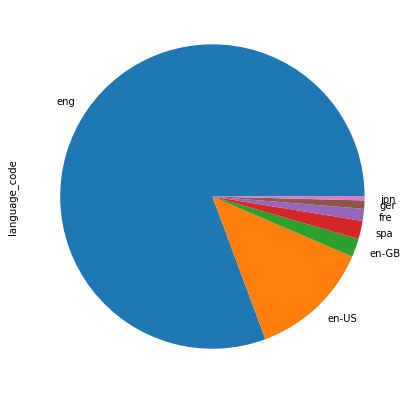

In [4079]:
df.language_code.value_counts().plot.pie(subplots=True, figsize=(7, 7))

**<p>Visual repartition of the average_ratings by languages :</p>**

D:\anaconda3\envs\goodreads\lib\site-packages\pandas\plotting\_matplotlib\tools.py:331: MatplotlibDeprecationWarning:


The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.



array([[<AxesSubplot:title={'center':'en-GB'}>,
        <AxesSubplot:title={'center':'en-US'}>,
        <AxesSubplot:title={'center':'eng'}>],
       [<AxesSubplot:title={'center':'fre'}>,
        <AxesSubplot:title={'center':'ger'}>,
        <AxesSubplot:title={'center':'jpn'}>],
       [<AxesSubplot:title={'center':'spa'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

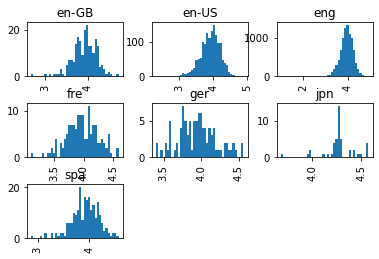

In [4080]:
df.hist("average_rating", by = "language_code", bins = 40)

### Exploration of the publication_date

**<p>We first convert this column in date format for a better exploitation, with the errors='coerce' option for some rows that seem to have a bad date.<br />
Counting those bad rows we see there is only two of them, so we delete them :</p>**

In [4081]:
#changing format
df['publication_date'] = pd.to_datetime(df['publication_date'], format='%m/%d/%Y', errors='coerce')

In [4082]:
df.publication_date

0       2006-09-16
1       2004-09-01
2       2003-11-01
3       2004-05-01
4       2004-09-13
           ...    
11122   2004-12-21
11123   1988-12-01
11124   1993-08-01
11125   2007-02-27
11126   2006-05-28
Name: publication_date, Length: 10945, dtype: datetime64[ns]

In [4083]:
#which are the bad date rows
df.loc[df.publication_date.isna(),:]

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
8180,31373,In Pursuit of the Proper Sinner (Inspector Lyn...,Elizabeth George,4.10,0553575104,9780553575101,eng,718.0,10608,295,NaT,Bantam Books
11098,45531,Montaillou village occitan de 1294 à 1324,Emmanuel Le Roy Ladurie/Emmanuel Le Roy-Ladurie,3.96,2070323285,9782070323289,fre,640.0,15,2,NaT,Folio histoire


In [4084]:
#drop the bad rows
df = df.drop(index=df.loc[df.publication_date.isna(),:].index)
df.publication_date.isna().sum()

0

**<p>What are the 10 years with the most books in the dataset :</p>**

In [4085]:
df.publication_date.dt.year.value_counts().head(10).to_frame()

,publication_date
2006,1682
2005,1241
2004,1047
2003,916
2002,783
2001,645
2000,529
2007,515
1999,444
1998,390


### Some more informations

**<p>What are the 10 most represented Publishers in the dataset :</p>**

In [4086]:
df.publisher.value_counts().head(10).to_frame()

,publisher
Vintage,318
Penguin Books,261
Penguin Classics,183
Mariner Books,148
Ballantine Books,143
Harper Perennial,112
HarperCollins,112
Pocket Books,111
Bantam,110
VIZ Media LLC,88


**<p>What are the 10 most represented Authors in the dataset :</p>**

In [4087]:
df.authors.value_counts().head(10).to_frame()

,authors
Stephen King,40
P.G. Wodehouse,40
Rumiko Takahashi,38
Orson Scott Card,35
Agatha Christie,33
Piers Anthony,30
Sandra Brown,29
Mercedes Lackey,29
Dick Francis,28
Terry Pratchett,23


**<p>In average which language has the books with the more pages ?<br />
    It seems fairly the same for most of the languages, german and japanese seems to be different but it's probably because they a lot less rows in the dataset:</p>**

In [4088]:
df.groupby('language_code', as_index=False)['num_pages'].mean()

,language_code,num_pages
0,en-GB,323.303738
1,en-US,339.315827
2,eng,345.651223
3,fre,341.848921
4,ger,401.354167
5,jpn,191.200000
6,spa,371.429245


## <span style="color:blue">4. Preparing the dataset for the Machine Learning part</span>

### Transforming language_code into dummies for better exploitation

In [4089]:
df_processed = pd.concat([df,pd.get_dummies(df.language_code)],axis=1).drop(columns="language_code")
df_processed

,bookID,title,authors,average_rating,isbn,isbn13,num_pages,ratings_count,text_reviews_count,publication_date,publisher,en-GB,en-US,eng,fre,ger,jpn,spa
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,0439785960,9780439785969,652.0,2095690,27591,2006-09-16,Scholastic Inc.,0,0,1,0,0,0,0
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,0439358078,9780439358071,870.0,2153167,29221,2004-09-01,Scholastic Inc.,0,0,1,0,0,0,0
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,0439554896,9780439554893,352.0,6333,244,2003-11-01,Scholastic,0,0,1,0,0,0,0
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,435.0,2339585,36325,2004-05-01,Scholastic Inc.,0,0,1,0,0,0,0
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,0439682584,9780439682589,2690.0,41428,164,2004-09-13,Scholastic,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11122,45631,Expelled from Eden: A William T. Vollmann Reader,William T. Vollmann/Larry McCaffery/Michael He...,4.06,1560254416,9781560254416,512.0,156,20,2004-12-21,Da Capo Press,0,0,1,0,0,0,0
11123,45633,You Bright and Risen Angels,William T. Vollmann,4.08,0140110879,9780140110876,635.0,783,56,1988-12-01,Penguin Books,0,0,1,0,0,0,0
11124,45634,The Ice-Shirt (Seven Dreams #1),William T. Vollmann,3.96,0140131965,9780140131963,415.0,820,95,1993-08-01,Penguin Books,0,0,1,0,0,0,0
11125,45639,Poor People,William T. Vollmann,3.72,0060878827,9780060878825,434.0,769,139,2007-02-27,Ecco,0,0,1,0,0,0,0


### Getting just the year from the date to feed the model

In [4090]:
df_processed[["year"]] = df_processed.publication_date.dt.year

In [4091]:
df_processed

,bookID,title,authors,average_rating,isbn,isbn13,num_pages,ratings_count,text_reviews_count,publication_date,publisher,en-GB,en-US,eng,fre,ger,jpn,spa,year
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,0439785960,9780439785969,652.0,2095690,27591,2006-09-16,Scholastic Inc.,0,0,1,0,0,0,0,2006
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,0439358078,9780439358071,870.0,2153167,29221,2004-09-01,Scholastic Inc.,0,0,1,0,0,0,0,2004
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,0439554896,9780439554893,352.0,6333,244,2003-11-01,Scholastic,0,0,1,0,0,0,0,2003
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,435.0,2339585,36325,2004-05-01,Scholastic Inc.,0,0,1,0,0,0,0,2004
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,0439682584,9780439682589,2690.0,41428,164,2004-09-13,Scholastic,0,0,1,0,0,0,0,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11122,45631,Expelled from Eden: A William T. Vollmann Reader,William T. Vollmann/Larry McCaffery/Michael He...,4.06,1560254416,9781560254416,512.0,156,20,2004-12-21,Da Capo Press,0,0,1,0,0,0,0,2004
11123,45633,You Bright and Risen Angels,William T. Vollmann,4.08,0140110879,9780140110876,635.0,783,56,1988-12-01,Penguin Books,0,0,1,0,0,0,0,1988
11124,45634,The Ice-Shirt (Seven Dreams #1),William T. Vollmann,3.96,0140131965,9780140131963,415.0,820,95,1993-08-01,Penguin Books,0,0,1,0,0,0,0,1993
11125,45639,Poor People,William T. Vollmann,3.72,0060878827,9780060878825,434.0,769,139,2007-02-27,Ecco,0,0,1,0,0,0,0,2007


### Dropping the unuseful columns

In [4092]:
df_processed = df_processed.drop(columns=["publication_date","title","authors","isbn","isbn13","publisher"])
df_processed

,bookID,average_rating,num_pages,ratings_count,text_reviews_count,en-GB,en-US,eng,fre,ger,jpn,spa,year
0,1,4.57,652.0,2095690,27591,0,0,1,0,0,0,0,2006
1,2,4.49,870.0,2153167,29221,0,0,1,0,0,0,0,2004
2,4,4.42,352.0,6333,244,0,0,1,0,0,0,0,2003
3,5,4.56,435.0,2339585,36325,0,0,1,0,0,0,0,2004
4,8,4.78,2690.0,41428,164,0,0,1,0,0,0,0,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11122,45631,4.06,512.0,156,20,0,0,1,0,0,0,0,2004
11123,45633,4.08,635.0,783,56,0,0,1,0,0,0,0,1988
11124,45634,3.96,415.0,820,95,0,0,1,0,0,0,0,1993
11125,45639,3.72,434.0,769,139,0,0,1,0,0,0,0,2007


### Drawing the correlation matrix for the processed dataset

#### We can see a few correlations, though there are not much on the average_rating line : only the num_pages columns seems to have a faint correlation with it.

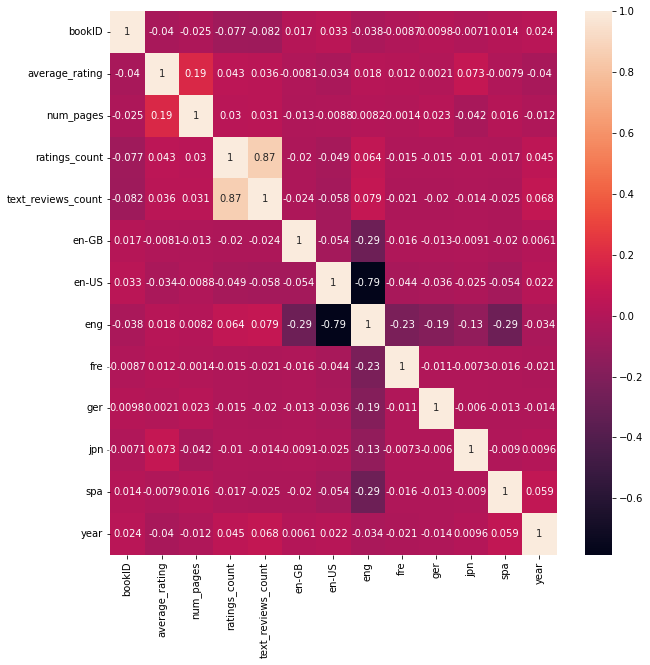

In [4093]:
plt.figure(figsize=(10,10))
sns.heatmap(df_processed.corr(),annot=True)
plt.show()

### Drawing a scatterplot fot the rating_counts, there seems to be a relation between it and the average ratings

In [4094]:
px.scatter(data_frame=df_processed,
           y="average_rating",
           x="ratings_count",
           size="text_reviews_count",
           color='num_pages',
           hover_data=['en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn', 'spa', 'year'],
           trendline="ols"
          )

### Doing the same fot the text_reviews_count it seem similar, though a little less pronounced

In [4095]:
px.scatter(data_frame=df_processed,
           y="average_rating",
           x="text_reviews_count",
           size="ratings_count",
           color='num_pages',
           hover_data=['en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn', 'spa', 'year'],
           trendline="ols"
          )

### At last doing the same fot the num_pages, then the relationship is clearer

In [4096]:
px.scatter(data_frame=df_processed,
           y="average_rating",
           x="num_pages",
           size="ratings_count",
           color='text_reviews_count',
           hover_data=['en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn', 'spa', 'year'],
           trendline="ols"
          )

## <span style="color:blue">5. Training models for the Machine Learning part</span>

### Since we are trying to predict a float value, we will try regression models, and we'll begin with the linear regression :

In [4097]:
from sklearn.model_selection import train_test_split

In [4098]:
df_train, df_test = train_test_split(df_processed,test_size = 0.2)

In [4099]:
len(df_processed)

10943

In [4100]:
len(df_train)

8754

In [4101]:
len(df_test)

2189

In [4102]:
df_train

,bookID,average_rating,num_pages,ratings_count,text_reviews_count,en-GB,en-US,eng,fre,ger,jpn,spa,year
6384,24028,4.00,163.0,46,0,0,0,1,0,0,0,0,2006
6228,23479,3.63,110.0,35,5,0,0,0,0,0,0,1,1994
775,2538,3.89,380.0,1295,106,0,0,0,0,0,0,1,2004
3804,13633,3.94,248.0,900,38,0,0,1,0,0,0,0,2005
6906,26047,3.92,395.0,6650,150,0,0,1,0,0,0,0,2006
...,...,...,...,...,...,...,...,...,...,...,...,...,...
588,1914,3.68,495.0,38,0,0,0,0,0,0,0,1,2006
2919,10806,4.10,234.0,1553,113,0,0,1,0,0,0,0,2002
4526,16313,3.80,337.0,49,10,0,0,1,0,0,0,0,2006
1751,6167,3.95,485.0,2923,214,0,0,1,0,0,0,0,2001


### Comparing the principal means between original dataset, train and test :

In [4103]:
print(df_processed.num_pages.mean())
print(df_train.num_pages.mean())
print(df_test.num_pages.mean())

344.703097870785
344.9804660726525
343.59387848332574


In [4104]:
print(df_processed.average_rating.mean())
print(df_train.average_rating.mean())
print(df_test.average_rating.mean())

3.940058484876176
3.94008339045008
3.9399588853357694


### Getting the columns for the train and test sets :

In [4105]:
df_train.columns

Index(['bookID', 'average_rating', 'num_pages', 'ratings_count',
       'text_reviews_count', 'en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn',
       'spa', 'year'],
      dtype='object')

In [4106]:
# get the values of the columns for the training data
X_train = df_train.loc[:,['bookID', 'num_pages', 'ratings_count', 'text_reviews_count',
       'en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn',
       'spa', 'year']].values
y_train = df_train.average_rating.values

In [4107]:
# get the values of the columns for the test data
X_test = df_test.loc[:,['bookID', 'num_pages', 'ratings_count', 'text_reviews_count',
       'en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn',
       'spa', 'year']].values
y_test = df_test.average_rating.values

### Import and deploy model :

In [4108]:
from sklearn.linear_model import LinearRegression

In [4109]:
linear_regression = LinearRegression()

In [4110]:
linear_regression.fit(X=X_train,y=y_train)

LinearRegression()

In [4111]:
y_test_pred_linear_regression = linear_regression.predict(X_test)

### Then looking at the Observed and Predicted values, the differences seem to be acceptable :

In [4112]:
Actual_Predicted = pd.DataFrame({'Observed': y_test.tolist(), 'Predicted': y_test_pred_linear_regression.tolist()})
Actual_Predicted['diff'] = Actual_Predicted['Observed'] - Actual_Predicted['Predicted']
Actual_Predicted.head(10)

,Observed,Predicted,diff
0,3.92,3.953641,-0.033641
1,3.77,3.900855,-0.130855
2,4.11,3.851143,0.258857
3,3.85,3.910376,-0.060376
4,3.71,3.882071,-0.172071
5,3.75,3.957722,-0.207722
6,3.77,3.935923,-0.165923
7,3.72,3.881686,-0.161686
8,3.75,3.872302,-0.122302
9,4.47,3.897979,0.572021


<AxesSubplot:>

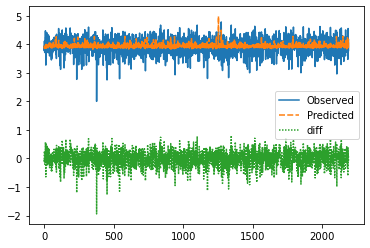

In [4113]:
sns.lineplot(data=Actual_Predicted)

### Importing metrics and calculate the model accuracy : it seems to be a fair result

In [4114]:
from sklearn.metrics import mean_absolute_error, max_error, mean_squared_error

In [4115]:
print('Mean Absolute Error :', mean_absolute_error(y_pred=y_test_pred_linear_regression,y_true=y_test).round(2))
print('Mean Squared Error :', mean_squared_error(y_pred=y_test_pred_linear_regression,y_true=y_test).round(2))
print('Maximum Error :', max_error(y_pred=y_test_pred_linear_regression,y_true=y_test).round(2))

Mean Absolute Error : 0.21
Mean Squared Error : 0.07
Maximum Error : 1.94


### Then we are trying other regression models : Decision Tree and Random Forest

In [4116]:
from sklearn.tree import DecisionTreeRegressor

In [4117]:
decision_tree = DecisionTreeRegressor()

In [4118]:
decision_tree.fit(X=X_train,y=y_train)

DecisionTreeRegressor()

In [4119]:
y_test_pred_decision_tree= decision_tree.predict(X_test)

In [4120]:
Actual_Predicted = pd.DataFrame({'Observed': y_test.tolist(), 'Predicted': y_test_pred_decision_tree.tolist()})
Actual_Predicted['diff'] = Actual_Predicted['Observed'] - Actual_Predicted['Predicted']
Actual_Predicted.head(10)

,Observed,Predicted,diff
0,3.92,3.89,0.03
1,3.77,4.05,-0.28
2,4.11,4.36,-0.25
3,3.85,3.70,0.15
4,3.71,4.72,-1.01
5,3.75,4.00,-0.25
6,3.77,3.91,-0.14
7,3.72,4.26,-0.54
8,3.75,4.42,-0.67
9,4.47,4.07,0.40


In [4121]:
print('Mean Absolute Error :', mean_absolute_error(y_pred=y_test_pred_decision_tree,y_true=y_test).round(2))
print('Mean Squared Error :', mean_squared_error(y_pred=y_test_pred_decision_tree,y_true=y_test).round(2))
print('Maximum Error :', max_error(y_pred=y_test_pred_decision_tree,y_true=y_test).round(2))

Mean Absolute Error : 0.29
Mean Squared Error : 0.15
Maximum Error : 2.05


In [4122]:
from sklearn.ensemble import RandomForestRegressor

In [4123]:
random_forrest = RandomForestRegressor()

In [4124]:
random_forrest.fit(X=X_train,y=y_train)

RandomForestRegressor()

In [4125]:
y_test_pred_random_forrest = random_forrest.predict(X_test)

In [4126]:
print('Mean Absolute Error :', mean_absolute_error(y_pred=y_test_pred_random_forrest,y_true=y_test).round(2))
print('Mean Squared Error :', mean_squared_error(y_pred=y_test_pred_random_forrest,y_true=y_test).round(2))
print('Maximum Error :', max_error(y_pred=y_test_pred_random_forrest,y_true=y_test).round(2))

Mean Absolute Error : 0.2
Mean Squared Error : 0.07
Maximum Error : 1.83


### Now we can compare our three models, it seems Random Forest is performing better :

In [4127]:
comparator = pd.DataFrame(np.array([
        ["Linear Regression",
        mean_absolute_error(y_pred=y_test_pred_linear_regression,y_true=y_test).round(2),
        mean_squared_error(y_pred=y_test_pred_linear_regression,y_true=y_test).round(2),
        max_error(y_pred=y_test_pred_linear_regression,y_true=y_test).round(2)]
    ,
        ["Decision Tree",
        mean_absolute_error(y_pred=y_test_pred_decision_tree,y_true=y_test).round(2),
        mean_squared_error(y_pred=y_test_pred_decision_tree,y_true=y_test).round(2),
        max_error(y_pred=y_test_pred_decision_tree,y_true=y_test).round(2)]
    ,
        ["Random Forest",
        mean_absolute_error(y_pred=y_test_pred_random_forrest,y_true=y_test).round(2),
        mean_squared_error(y_pred=y_test_pred_random_forrest,y_true=y_test).round(2),
        max_error(y_pred=y_test_pred_random_forrest,y_true=y_test).round(2)],
    ],),
 columns=["Model Name","Mean Absolute Error","Mean Squared Error","Maximum Error"]
)
comparator      

,Model Name,Mean Absolute Error,Mean Squared Error,Maximum Error
0,Linear Regression,0.21,0.07,1.94
1,Decision Tree,0.29,0.15,2.05
2,Random Forest,0.2,0.07,1.83


grandes valeurs ratings et text review, nb de pages, ratings faibles?

## <span style="color:blue">6. Improve models by refining the data</span>

### What can we do to improve these results ?
### We saw above that ratings_counts, text_reviews_count and num_pages were related to average_ratings : the higher they were, they higher was the average rating, so it seems unuseful to delete the higher rows for these.
### But there is one thing to experiment : the low rated books. It's highly possible that books with less ratings don't have a significant average_ratings, so we will try to delete them from the dataset

In [4128]:
#deleting the books with ratings_count under 100
df_processed2 = df_processed.loc[df.ratings_count > 100]

### Now we redo all steps to test our models with the new dataset :

In [4129]:
df_train2, df_test2 = train_test_split(df_processed2,test_size = 0.2)

### Comparing the principal means between original dataset, train and test :

In [4130]:
print(df_processed2.num_pages.mean())
print(df_train2.num_pages.mean())
print(df_test2.num_pages.mean())

354.3073701842546
354.3312892611427
354.2117224880383


In [4131]:
print(df_processed2.average_rating.mean())
print(df_train2.average_rating.mean())
print(df_test2.average_rating.mean())

3.9543156257477863
3.954735267723602
3.952637559808612


### Getting the columns for the train and test sets :

In [4132]:
df_train2.columns

Index(['bookID', 'average_rating', 'num_pages', 'ratings_count',
       'text_reviews_count', 'en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn',
       'spa', 'year'],
      dtype='object')

In [4133]:
# get the values of the columns for the training data
X_train2 = df_train2.loc[:,['bookID', 'num_pages', 'ratings_count', 'text_reviews_count',
       'en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn',
       'spa', 'year']].values
y_train2 = df_train2.average_rating.values

In [4134]:
# get the values of the columns for the test data
X_test2 = df_test2.loc[:,['bookID', 'num_pages', 'ratings_count', 'text_reviews_count',
       'en-GB', 'en-US', 'eng', 'fre', 'ger', 'jpn',
       'spa', 'year']].values
y_test2 = df_test2.average_rating.values

### Import and deploy model :

In [4135]:
from sklearn.linear_model import LinearRegression

In [4136]:
linear_regression = LinearRegression()

In [4137]:
linear_regression.fit(X=X_train2,y=y_train2)

LinearRegression()

In [4138]:
y_test_pred_linear_regression2 = linear_regression.predict(X_test2)

### Then looking at the Observed and Predicted values, the differences seem to be acceptable :

In [4139]:
Actual_Predicted2 = pd.DataFrame({'Observed': y_test2.tolist(), 'Predicted': y_test_pred_linear_regression2.tolist()})
Actual_Predicted2['diff'] = Actual_Predicted2['Observed'] - Actual_Predicted2['Predicted']
Actual_Predicted2.head(10)

,Observed,Predicted,diff
0,4.45,3.960193,0.489807
1,4.20,4.090385,0.109615
2,4.06,3.936487,0.123513
3,4.47,3.914536,0.555464
4,3.92,3.957207,-0.037207
5,3.72,3.924253,-0.204253
6,4.30,3.954844,0.345156
7,4.02,3.960787,0.059213
8,3.76,3.952566,-0.192566
9,4.19,3.956701,0.233299


<AxesSubplot:>

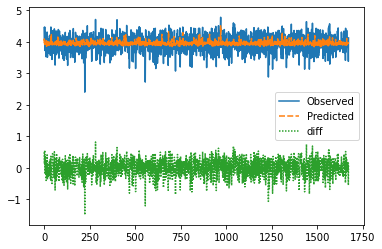

In [4140]:
sns.lineplot(data=Actual_Predicted2)

### Importing metrics and calculate the model accuracy : it seems to be a fair result

In [4141]:
from sklearn.metrics import mean_absolute_error, max_error, mean_squared_error

In [4142]:
print('Mean Absolute Error :', mean_absolute_error(y_pred=y_test_pred_linear_regression2,y_true=y_test2).round(2))
print('Mean Squared Error :', mean_squared_error(y_pred=y_test_pred_linear_regression2,y_true=y_test2).round(2))
print('Maximum Error :', max_error(y_pred=y_test_pred_linear_regression2,y_true=y_test2).round(2))

Mean Absolute Error : 0.2
Mean Squared Error : 0.07
Maximum Error : 1.5


### Then we are trying other regression models : Decision Tree and Random Forest

In [4143]:
from sklearn.tree import DecisionTreeRegressor

In [4144]:
decision_tree = DecisionTreeRegressor()

In [4145]:
decision_tree.fit(X=X_train2,y=y_train2)

DecisionTreeRegressor()

In [4146]:
y_test_pred_decision_tree2= decision_tree.predict(X_test2)

In [4147]:
Actual_Predicted2 = pd.DataFrame({'Observed': y_test2.tolist(), 'Predicted': y_test_pred_decision_tree2.tolist()})
Actual_Predicted2['diff'] = Actual_Predicted2['Observed'] - Actual_Predicted2['Predicted']
Actual_Predicted2.head(10)

,Observed,Predicted,diff
0,4.45,3.68,0.77
1,4.20,4.01,0.19
2,4.06,4.04,0.02
3,4.47,4.52,-0.05
4,3.92,4.04,-0.12
5,3.72,3.86,-0.14
6,4.30,3.74,0.56
7,4.02,3.68,0.34
8,3.76,4.31,-0.55
9,4.19,3.75,0.44


In [4148]:
print('Mean Absolute Error :', mean_absolute_error(y_pred=y_test_pred_decision_tree2,y_true=y_test2).round(2))
print('Mean Squared Error :', mean_squared_error(y_pred=y_test_pred_decision_tree2,y_true=y_test2).round(2))
print('Maximum Error :', max_error(y_pred=y_test_pred_decision_tree2,y_true=y_test2).round(2))

Mean Absolute Error : 0.27
Mean Squared Error : 0.12
Maximum Error : 1.39


In [4149]:
from sklearn.ensemble import RandomForestRegressor

In [4150]:
random_forrest = RandomForestRegressor()

In [4151]:
random_forrest.fit(X=X_train2,y=y_train2)

RandomForestRegressor()

In [4152]:
y_test_pred_random_forrest2 = random_forrest.predict(X_test2)

In [4153]:
print('Mean Absolute Error :', mean_absolute_error(y_pred=y_test_pred_random_forrest2,y_true=y_test2).round(2))
print('Mean Squared Error :', mean_squared_error(y_pred=y_test_pred_random_forrest2,y_true=y_test2).round(2))
print('Maximum Error :', max_error(y_pred=y_test_pred_random_forrest2,y_true=y_test2).round(2))

Mean Absolute Error : 0.19
Mean Squared Error : 0.06
Maximum Error : 1.48


### Now we can compare our three models, again it seems Random Forest is performing better :

In [4154]:
comparator2 = pd.DataFrame(np.array([
        ["Linear Regression",
        mean_absolute_error(y_pred=y_test_pred_linear_regression2,y_true=y_test2).round(2),
        mean_squared_error(y_pred=y_test_pred_linear_regression2,y_true=y_test2).round(2),
        max_error(y_pred=y_test_pred_linear_regression2,y_true=y_test2).round(2)]
    ,
        ["Decision Tree",
        mean_absolute_error(y_pred=y_test_pred_decision_tree2,y_true=y_test2).round(2),
        mean_squared_error(y_pred=y_test_pred_decision_tree2,y_true=y_test2).round(2),
        max_error(y_pred=y_test_pred_decision_tree2,y_true=y_test2).round(2)]
    ,
        ["Random Forest",
        mean_absolute_error(y_pred=y_test_pred_random_forrest2,y_true=y_test2).round(2),
        mean_squared_error(y_pred=y_test_pred_random_forrest2,y_true=y_test2).round(2),
        max_error(y_pred=y_test_pred_random_forrest2,y_true=y_test2).round(2)],
    ],),
 columns=["Model Name","Mean Absolute Error","Mean Squared Error","Maximum Error"]
)
comparator2      

,Model Name,Mean Absolute Error,Mean Squared Error,Maximum Error
0,Linear Regression,0.2,0.07,1.5
1,Decision Tree,0.27,0.12,1.39
2,Random Forest,0.19,0.06,1.48


### Comparing the new results above with the ones from the first it seems that deleting the low ratings_count did improve our models, has MAE and MSE are lower :

In [4155]:
comparator

,Model Name,Mean Absolute Error,Mean Squared Error,Maximum Error
0,Linear Regression,0.21,0.07,1.94
1,Decision Tree,0.29,0.15,2.05
2,Random Forest,0.2,0.07,1.83
